### The goal of this notebook is to leverage the Top2Vec model to identify key topics within game reviews. Top2Vec is a powerful model that can analyze documents without extensive text preprocessing and effectively identify topics by finding similar documents based on user input. Additionally, Top2Vec can return related documents or generate word clouds. This provides a visual representation of the topics most relevant to the user's query.

### Overview: Players have expressed concerns about the game's difficulty, login issues, crashing issues, the requirement to watch mandatory story segments. They have requested a skip button to skip animation stories in the game. However, they appreciate the effort put into character development and scene design.

## Import libraries

In [33]:
import pandas as pd
import nltk
import gensim
from gensim.utils import simple_preprocess
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from top2vec import Top2Vec

In [20]:
# nltk.download('punkt')
# nltk.download('stopwords')
#nltk.download('wordnet')

## Read DataFrame

In [3]:
df = pd.read_csv("Honkai-Star-Rail-modeling.csv")

In [4]:
df.head()

,snippet,positive_rating
0,The combat is turn-based which is not my favor...,Positive
1,The constant grind for materials to activate c...,Negative
2,I love this game so much. The only mobile game...,Positive
3,I love this game. It has amazing story and cha...,Positive
4,Decent game overall. Beautiful character and m...,Positive


In [23]:
documents = df["snippet"]
documents  = list(documents)

## Text Preprocessing

### Even though top2vec does not require text preprocessing, to make more concise, text preprocessing is still needed

In [24]:
# get stopwords from nltk
stopword_voca = set(stopwords.words('english'))

# tokenized docs by gensim
tokenized_docs = [simple_preprocess(doc) for doc in documents]

### Remove stopwrods

In [25]:
filtered_docs = []
for words in tokenized_docs:
    filtered_words = []
    
    for word in words:
        if word not in stopword_voca:
            filtered_words.append(word)
            
    filtered_docs.append(filtered_words)

### Lemmatization

In [26]:
wl = WordNetLemmatizer()
lemm_docs = []

for words in filtered_docs:
    lemm_words = []
    for word in words:
        lemm_words.append(wl.lemmatize(word))
    lemm_docs.append(lemm_words)

### Tokenize into bigram and trigram

In [40]:
bigrams_phrases = gensim.models.Phrases(lemm_docs, min_count=5, threshold=50)
trigrams_phrases = gensim.models.Phrases(bigrams_phrases[lemm_docs], threshold=50)

raw_bigram = gensim.models.phrases.Phraser(bigrams_phrases)
raw_trigram = gensim.models.phrases.Phraser(bigrams_phrases)

In [41]:
bigram_docs = [doc for doc in raw_bigram[lemm_docs]]
trigram_docs = [doc for doc in raw_trigram[raw_bigram[lemm_docs]]]

In [62]:
print(bigram_docs[0])
print("\n")
print(trigram_docs[0])

['combat', 'turn_based', 'favorite', 'game', 'made', 'look', 'cool', 'although', 'get', 'repetitive', 'story', 'strong', 'part', 'game', 'opinion', 'every', 'planet', 'look', 'unique', 'different', 'puzzle', 'chest', 'biggest', 'complain', 'character', 'balance', 'ok', 'edit', 'still', 'powercreep', 'issue', 'day', 'every', 'new', 'character', 'way', 'better', 'previous', 'one', 'push', 'player', 'spending', 'game']


['combat', 'turn_based', 'favorite', 'game', 'made', 'look', 'cool', 'although', 'get', 'repetitive', 'story', 'strong', 'part', 'game', 'opinion', 'every', 'planet', 'look', 'unique', 'different', 'puzzle', 'chest', 'biggest', 'complain', 'character', 'balance', 'ok', 'edit', 'still', 'powercreep', 'issue', 'day', 'every', 'new', 'character', 'way', 'better', 'previous', 'one', 'push', 'player', 'spending', 'game']


### Join words into documents

In [63]:
preprocessed_bigram_docs = [" ".join(doc) for doc in bigram_docs]
preprocessed_trigram_docs = ["".join(doc) for doc in trigram_docs]

## Top2Vec

In [65]:
top2vec = Top2Vec(preprocessed_bigram_docs, embedding_model="universal-sentence-encoder", tokenizer=None)

2024-08-29 23:45:44,210 - top2vec - INFO - Pre-processing documents for training
C:\Users\42128\miniconda3\lib\site-packages\sklearn\feature_extraction\text.py:521: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
2024-08-29 23:45:45,491 - top2vec - INFO - Downloading universal-sentence-encoder model
2024-08-29 23:46:24,731 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-08-29 23:46:29,026 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-08-29 23:47:16,440 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-08-29 23:47:17,980 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [66]:
top2vec.get_num_topics()

119

#### The most common document is at index 0 with 896 frequency across all documents.

In [67]:
# Freuqnecy of documents that shares the same topic
# Topic Numbers
topic_size, topic_nums = top2vec.get_topic_sizes()
print(topic_size)
print(topic_nums)

[896 826 724 700 620 548 436 421 385 372 352 346 330 326 304 293 292 290
 285 282 274 274 265 263 257 243 237 232 213 208 204 197 196 194 194 181
 179 178 170 170 168 167 163 162 151 151 147 145 140 138 138 138 137 132
 130 127 126 125 123 119 117 111 103  98  98  96  94  90  89  87  87  87
  86  77  77  76  74  73  71  71  68  67  67  67  66  66  65  62  62  61
  58  58  57  57  57  55  54  53  51  51  50  50  48  48  46  45  45  45
  44  43  43  37  36  33  32  31  30  24  22]
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118]


In [68]:
# topic_words: the key words in each topic
# word_scores: how close these words relates to that specific topic
# topic_nums: topic numbers
topic_words, word_scores, topic_nums = top2vec.get_topics(76)

In [69]:
# The first five topics
print(topic_words[0:5])

[['gameplay' 'game' 'turn_based' 'art_style' 'jrpg' 'enjoyable'
  'playable' 'rpg' 'side_quest' 'entertaining' 'open_world' 'masterpiece'
  'cut_scene' 'cutscene' 'enjoyed' 'visuals' 'rpgs' 'cutscenes' 'fun'
  'immersive' 'phenomenal' 'gaming' 'unplayable' 'hype' 'superb'
  'satisfying' 'played' 'addicting' 'exciting' 'animation' 'fps'
  'storyline' 'fantastic' 'laggy' 'devs' 'dev' 'amazing' 'incredible'
  'npc' 'player' 'playing' 'favorite' 'wonderful' 'excited' 'super'
  'boring' 'play' 'enjoy' 'engaging' 'character']
 ['turn_based' 'jrpg' 'gameplay' 'rpgs' 'rpg' 'combat' 'art_style'
  'open_world' 'game' 'side_quest' 'playable' 'auto_battle' 'cutscenes'
  'laggy' 'fps' 'cutscene' 'cut_scene' 'immersive' 'gaming' 'qol'
  'unplayable' 'anime' 'pvp' 'battle' 'npc' 'animation' 'played' 'boring'
  'lag' 'dev' 'gacha' 'repetitive' 'genre' 'blade' 'action' 'enjoyable'
  'persona' 'adventure' 'developer' 'hype' 'lagging' 'rng' 'fighting'
  'visuals' 'exciting' 'devs' 'engaging' 'fun' 'enter

## Word Cloud

### Search "Error"

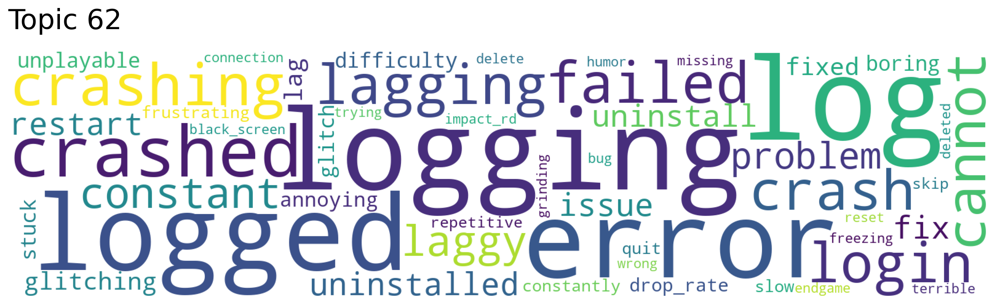

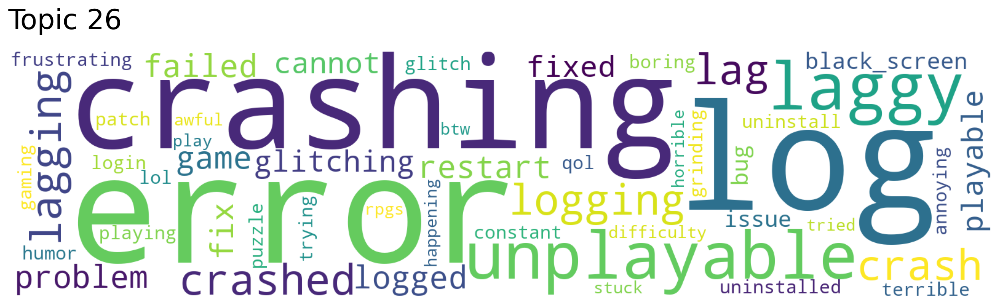

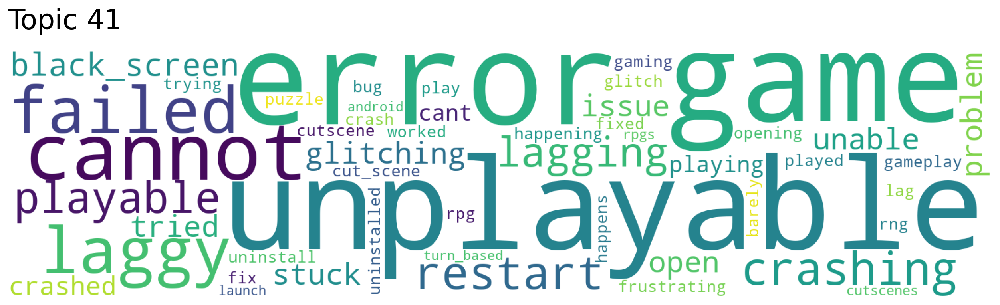

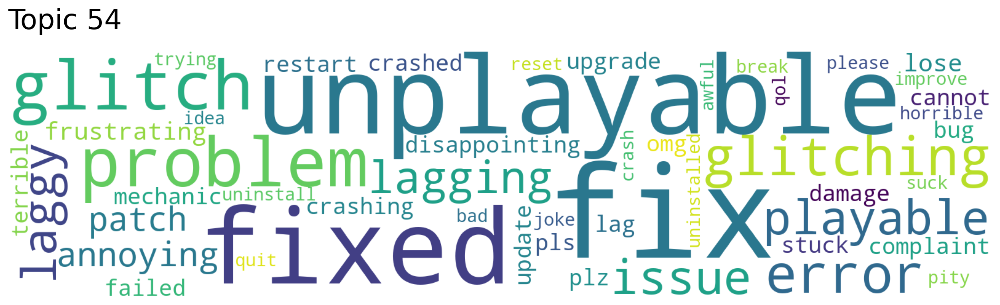

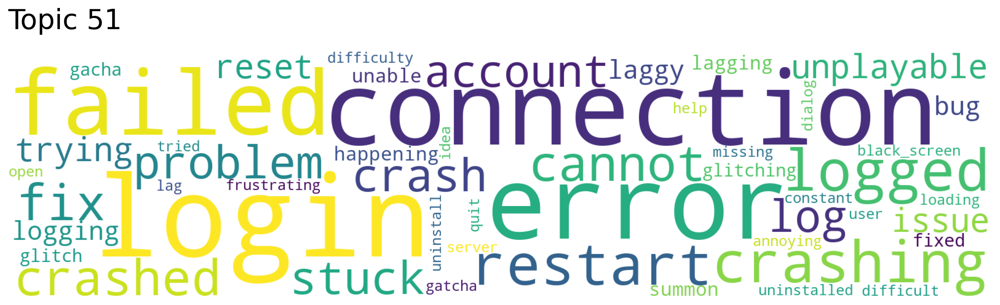

In [70]:
topic_words, word_scores, topic_scores, topic_nums = top2vec.search_topics(keywords=["error"], num_topics=5)
for topic in topic_nums:
    top2vec.generate_topic_wordcloud(topic, background_color="white")

### Search "Problem"

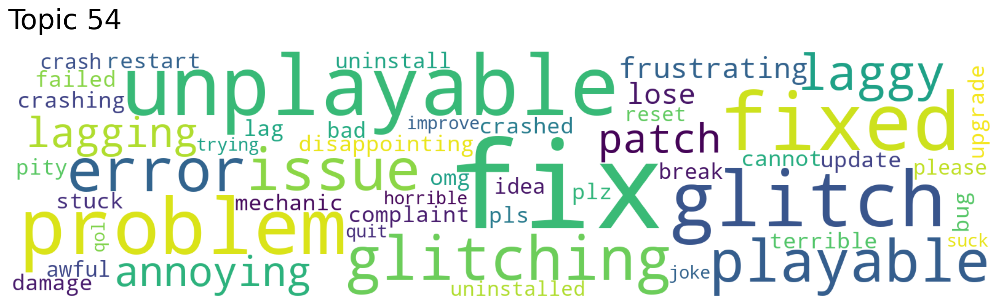

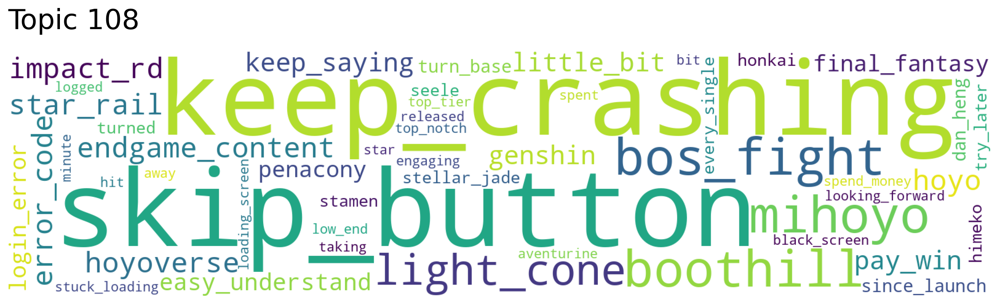

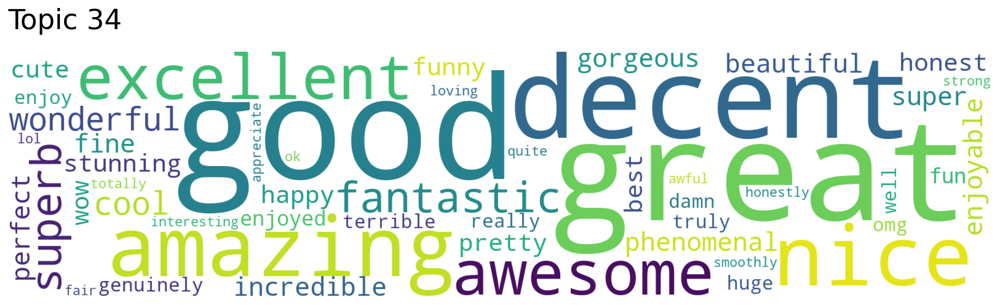

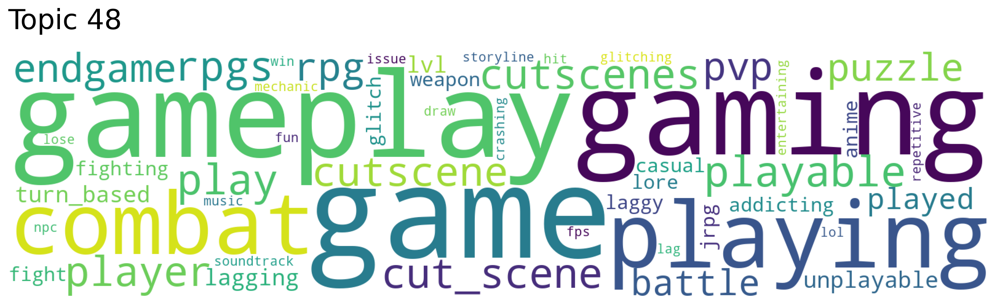

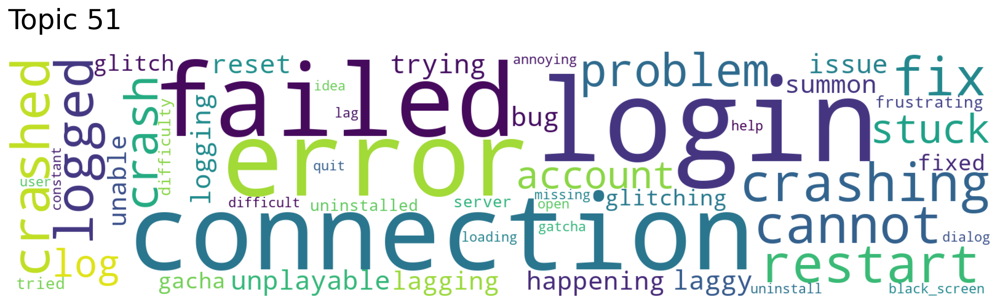

In [71]:
topic_words, word_scores, topic_scores, topic_nums = top2vec.search_topics(keywords=["problem"], num_topics=5)
for topic in topic_nums:
    top2vec.generate_topic_wordcloud(topic, background_color="white")

### Search "Character"

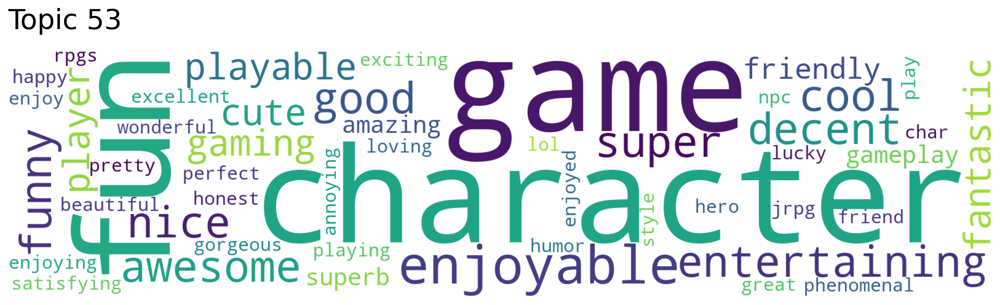

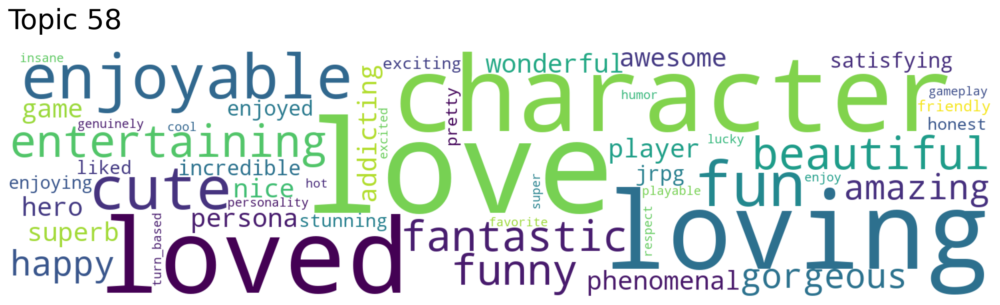

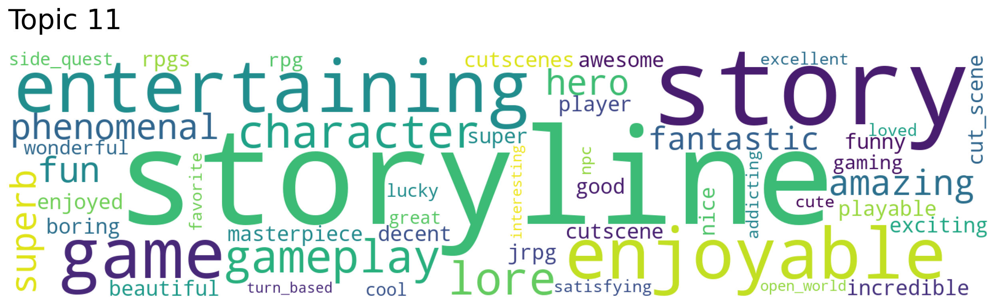

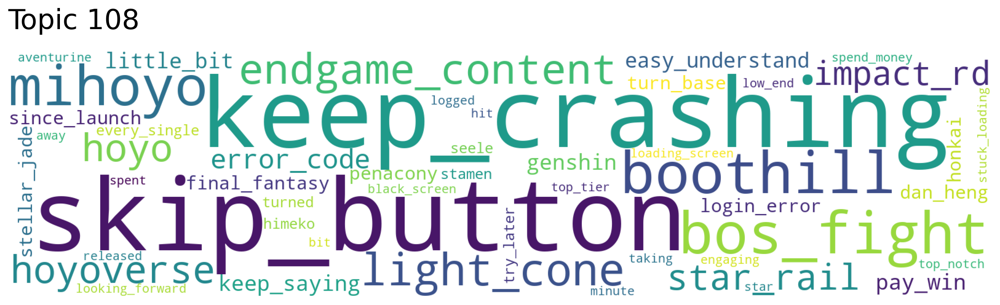

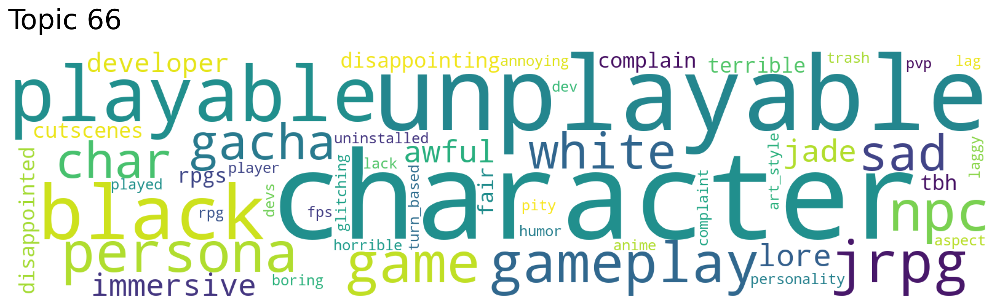

In [72]:
topic_words, word_scores, topic_scores, topic_nums = top2vec.search_topics(keywords=["character"], num_topics=5)
for topic in topic_nums:
    top2vec.generate_topic_wordcloud(topic, background_color="white")

### Return output by documents based on user input

In [76]:
documents, document_scores, document_ids = top2vec.search_documents_by_topic(topic_num = 51, num_docs=5)

for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score {score}")
    print("------")
    print(doc)
    print("------")
    print()

Document: 12849, Score 0.8551206588745117
------
able login keep getting login failed error
------

Document: 15249, Score 0.8298110365867615
------
login issue keep getting tip error logins
------

Document: 14226, Score 0.8277967572212219
------
login failed error_occured please fix
------

Document: 18523, Score 0.8231075406074524
------
login problem error
------

Document: 6471, Score 0.8206269145011902
------
login issue login matter hard tried
------

